In [1]:
USE {
    dependencies("org.mariadb.jdbc:mariadb-java-client:3.1.4")
}

In [2]:
%use dataframe, kandy

In [3]:
import org.jetbrains.kotlinx.dataframe.DataFrame
import org.jetbrains.kotlinx.dataframe.api.describe
import org.jetbrains.kotlinx.dataframe.api.print
import org.jetbrains.kotlinx.dataframe.io.DatabaseConfiguration
import org.jetbrains.kotlinx.dataframe.io.getSchemaForSqlTable
import org.jetbrains.kotlinx.dataframe.io.readSqlTable
import org.jetbrains.kotlinx.dataframe.io.getSchemaForAllSqlTables
import org.jetbrains.kotlinx.dataframe.schema.DataFrameSchema
import java.sql.DriverManager
import java.util.*


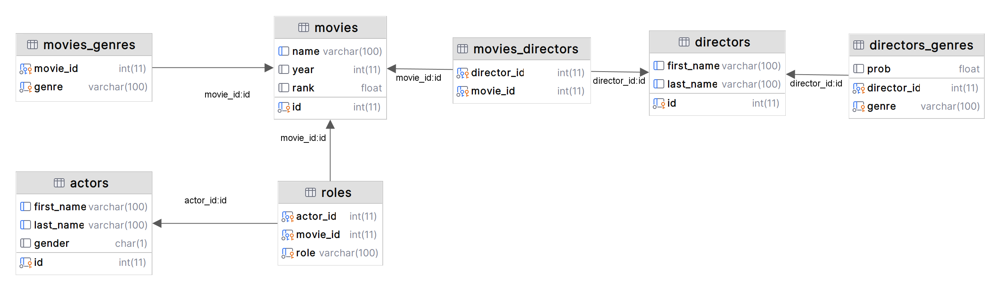

In [4]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/schema.png"))
DISPLAY(image)

In [5]:
val URL = "jdbc:mariadb://localhost:3306/imdb"
val USER_NAME = "root"
val PASSWORD = "pass"

val dbConfig = DatabaseConfiguration(URL, USER_NAME, PASSWORD)

# Exploring the movies: trending rank by year depends on genre

Let's analyze how films in the genres of **Comedy** and **Horror** were rated across the 20th century. 

We'll compare audience perceptions and trends over time to understand how these genres evolved.



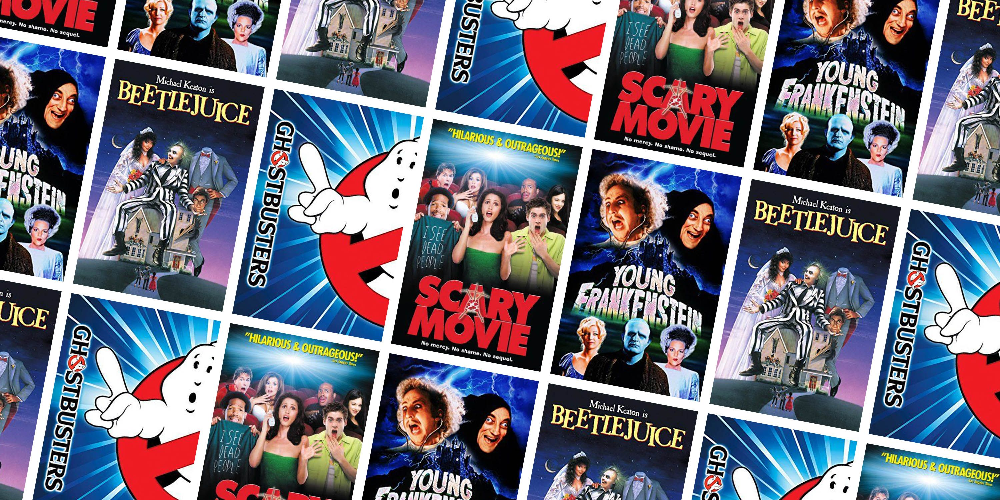

In [6]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/horror-comedie.jpg"))
DISPLAY(image)

To prevent overloading **RAM**, let's filter and combine data from tables directly on the database.

In [7]:
val sqlQuery = """
SELECT name, year, rank, genre
FROM movies
INNER JOIN movies_genres ON movies.id = movies_genres.movie_id
WHERE movies.rank > 0.0 and (movies_genres.genre = "Comedy" OR movies_genres.genre = "Horror")
"""

val ratedMoviesDf = DataFrame.readSqlQuery(dbConfig, sqlQuery)
ratedMoviesDf

name,year,rank,genre
$,1971,"6,400000",Comedy
"$1,000,000 Duck",1971,"5,000000",Comedy
$1000 a Touchdown,1939,"6,700000",Comedy
$30,1999,"7,500000",Comedy
"$40,000",1996,"9,600000",Comedy
"'?' Motorist, The",1906,"6,800000",Comedy
'A' gai waak,1983,"7,200000",Comedy
'A' gai waak juk jaap,1987,"7,200000",Comedy
'Babicky dobjejte presne!',1983,"5,600000",Horror
"'burbs, The",1989,"5,900000",Comedy


In [8]:
val finalDf = ratedMoviesDf
    .select { year and genre and rank }
    .groupBy { year and genre }
    .mean { rank named "meanRank" } 
    //.aggregate {  mean { rank } into "meanRank" } <-- alternative to the previous row
    .sortBy { year and genre }

finalDf

year,genre,meanRank
1892,Comedy,"5,100000"
1895,Comedy,"6,850000"
1896,Comedy,"3,550000"
1896,Horror,"4,250000"
1897,Comedy,"4,500000"
1898,Comedy,"4,620000"
1898,Horror,"3,200000"
1899,Comedy,"4,280000"
1899,Horror,"3,300000"
1900,Comedy,"4,612500"


In [9]:
val genreRankTrends = finalDf.plot {
    line {
        x(year)
        y(meanRank)
        color(genre)
        width = 3.0
    }
    layout.size = 1000 to 600
}
genreRankTrends

<head>
 <meta charset="UTF-8">
 <style> html, body { margin: 0; overflow: hidden; } </style>
 <script type="text/javascript" data-lets-plot-script="library" src="https://cdn.jsdelivr.net/gh/JetBrains/lets-plot@v4.2.0/js-package/distr/lets-plot.min.js"></script>
 </head>
 <body>
 <div id="x89Aiw"></div>
 <script type="text/javascript" data-lets-plot-script="plot">
 var plotSpec={
"mapping":{
},
"data":{
"meanRank":[5.099999904632568,6.849999904632568,3.549999952316284,4.25,4.5,4.619999980926513,3.200000047683716,4.2799999713897705,3.299999952316284,4.612500011920929,4.7416666348775225,4.366666714350383,5.375000059604645,4.953846142842219,4.563636411320079,6.066666762034099,5.480000019073486,5.416666666666667,5.066666642824809,5.099999904632568,4.9666666984558105,5.900000095367432,6.424999952316284,5.840000057220459,4.900000095367432,6.041666666666667,7.300000190734863,6.061363621191545,6.300000190734863,5.734285681588309,7.400000095367432,6.079411752083722,6.754166642824809,6.596153809474065,7.044444455040826,7.699999809265137,6.724999934434891,6.650000095367432,6.954166650772095,7.136363679712469,7.766666730244954,6.607692351708045,7.5,6.35357141494751,7.400000095367432,6.830952360516503,6.849999904632568,6.936000027656555,7.3999998569488525,6.997435869314732,7.5,7.177777841356066,6.900000095367432,6.722727284286961,7.799999952316284,6.022222233197046,6.099999904632568,6.296732025208816,7.237499952316284,6.630882389405194,6.691666642824809,6.5793333339691165,6.580000019073486,6.450270290632505,5.485714163099017,6.380628283735345,6.291666746139526,6.475576031592585,5.785714285714286,6.371493214395791,7.349999904632568,6.318139544198679,6.5333333015441895,6.419000020027161,5.959999990463257,6.305479474263649,5.49333332379659,6.229752054884414,5.930769223433274,6.478787883363589,5.100000030854169,6.498170747989562,5.793333307902018,6.465789482781761,5.595833321412404,6.350406516858233,5.911764705882353,6.444202901660532,5.064285670007978,6.376190472622307,4.299999952316284,6.506896549257739,5.2399999618530275,6.461827948529233,5.875,6.472560968340897,6.424064169593036,6.012500047683716,6.394358982183994,5.342857190540859,6.305235599348058,6.033333407508002,6.354497360804724,5.925000071525574,6.310919530090245,5.529999995231629,6.048520713162845,4.915789491251895,6.075925922688143,4.254999974370003,6.076923084564698,4.500000009934108,6.16163524441749,4.713513528978503,6.166901384440946,5.736111130979326,5.967999986012777,4.958620700342902,6.043930614614762,4.674468101339137,6.061494247666721,5.15128205372737,6.068604659202487,4.899999987247378,5.820707074921541,4.341860485631366,5.913440869059614,4.591111132833693,5.625870638818883,4.474999970859951,5.777325577514116,4.936585356549519,5.450289022715794,4.371428574834551,5.642458088571133,4.398148123864774,5.33333333535383,4.526136344129389,5.439181283203482,4.282857121740069,5.432738091974032,4.788541663438082,5.575510189646766,4.477777787380749,5.6550295839648275,4.4319999885559085,5.471005929292306,4.6951612907071265,5.638461539025843,4.62166668176651,5.656497176084141,4.714285712156977,5.250276238878787,4.431372537332423,5.363963959990321,4.56301367119567,5.495049513212525,4.445882370892693,5.4574162811753855,4.3530302716024,5.53037382341991,4.347826071407484,5.544642858207226,4.27200001001358,5.6179389234717565,4.413333322207133,5.3643153559617485,4.598837209302325,5.288732401921716,4.307317069875515,5.331159419771554,4.407092195030645,5.457575751073433,4.1596638605374245,5.225622786321674,4.20312499627471,5.597169815369372,4.483116877543462,5.372542367951344,4.49375,5.569055379407802,4.4065789266636495,5.395810060327945,4.7380281753943,5.9190058387510955,4.585897464018601,5.780660384106186,4.589610384656237,5.216352204106888,4.771264366719914,5.850722020498682,4.681443297985902,5.70326894264873,4.9192982431043655,5.899568339217481,4.973913031211798,6.01406685439325,5.060869552087093,6.131601126341337,5.40434781105622,6.1126344082176045,5.3840579641038095,5.97277354648095,5.59

If you'd like to export the plot to a file, you have two options. 

You can either use the function call `genreRankTrends.save("exported_plot.png")`, 

or you can click on the three dots in the top left corner, then select **SavePlotAs** from the drop-down menu

In [10]:
genreRankTrends.save("exported_plot.png")

C:\Users\Aleksey.Zinovev\IdeaProjects\Unlocking-SQL-KotlinConf-2024\notebooks\db\lets-plot-images\exported_plot.png

**Summary:**

In the latest cell of the notebook, we explored converting the result of an SQL query into a DataFrame, constructing a chart from the data, and exporting this chart to a file.